# Credit Scoring - Binary probabilistic classifier [7/3/2021]

![Pic](https://i.postimg.cc/7YxGMrvD/credit-scoring.png)

## GENERAL INFORMATION <a name="intro"></a>

### Introduction

As part of this project, I built a credit scoring model based on a binary probabilistic classifier.

In machine learning, a probabilistic binary classifier is a supervised classifier that is able to predict, given an observation of an input, a probability distribution over a set of two classes, rather than only outputting the most likely class that the observation should belong to.

A credit scoring model is a mathematical model used to estimate the probability of default, which is the probability that customers may trigger a credit event (i.e. bankruptcy, obligation default, failure to pay, and cross-default events). In a credit scoring model, the probability of default is normally presented in the form of a credit score. The higher score refers to a lower probability of default.

Based on this score, a bank employee can make an educated decision, whether to issue a loan to a client, and if so, at what interest rate. Accurate and predictive credit scoring models help maximize the risk-adjusted return of a financial institution.

[Source 1](https://en.wikipedia.org/wiki/Probabilistic_classification), [Source 2](https://www.mathworks.com/discovery/credit-scoring-model.html), [Picture source](https://www.centerforfinancialinclusion.org/how-alternative-credit-scoring-can-work-for-the-unbanked-and-the-bottom-line)

### Description of variables

* **client_id** - client id number
* **education** - education level
* **sex** - client's gender
* **age** - client's age
* **car** - car availability
* **car_type** - foreign-made car indicator
* **decline_app_cnt** - number of rejected applications
* **good_work** - well-paid job indicator
* **bki_request_cnt** - number of BKI requests 
* **home_address** - home address categorizer
* **work_address** - work address categorizer
* **income** - client's income (RUB)
* **foreign_passport** - availability of foreign passport
* **sna** - degree of connection to other bank's clients
* **first_time** - indicator of how long client's info exists in bank's database
* **score_bki** - BKI internal score
* **region_rating** - rating of client'region
* **app_date** - date of application
* **default** - credit default indicator

### Table of Content
0. [General information](#intro)
1. [Prepare problem](#prepare)
2. [Analize data](#analize)
3. [Prepare data](#data)
4. [Modelling](#modelling)
5. [Submission](#submission)

## PREPARE PROBLEM <a name="prepare"></a>

### 1) Load libraries

In [5]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline
%config InlineBackend.figure_format = 'svg'

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

from datetime import datetime, timedelta

import warnings
warnings.filterwarnings('ignore')

pd.options.display.max_rows = 999
# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [6]:
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder, QuantileTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import KFold, StratifiedKFold, RepeatedStratifiedKFold, cross_val_score, GridSearchCV, train_test_split, RandomizedSearchCV
from sklearn.feature_selection import SelectPercentile, SelectFromModel, RFE, chi2, f_classif, mutual_info_classif, SelectKBest
from sklearn.metrics import auc, recall_score, confusion_matrix, f1_score, classification_report, precision_recall_curve, average_precision_score, roc_curve, roc_auc_score
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.decomposition import PCA
from sklearn.compose import ColumnTransformer

### 2) Load dataset

In [7]:
df_train = pd.read_csv('data/train.csv')
df_test = pd.read_csv('data/test.csv')
sample_submission = pd.read_csv('data/sample_submission.csv')

Let's merge train & test sets for further data preparation. 

**Note that in a competition, we have all input data we ever need to care about. Therefore we could prepare it all together, without having to deal with possible data leakages. In a real project, data leakage issue should be taken into account while preparing the data.**

In [8]:
# add target column to test data set 
df_test['default'] = 0

# label train & test sets
df_train['train'] = 1
df_test['train'] = 0

# concatenate sets
df = pd.concat([df_train, df_test], ignore_index=True)

# save test ids
test_id = df_test.client_id

## ANALIZE DATA <a name="analize"></a>

### 1) Descriptive statistics

Let's check the shapes of the loaded data sets.

In [9]:

print(f'Train data shape: {df_train.shape}')
print(f'Test data shape: {df_test.shape}')
print(f'Submission sample shape: {sample_submission.shape}')

Train data shape: (73799, 20)
Test data shape: (36349, 20)
Submission sample shape: (24354, 2)


We are dealing with rather large dataset with almost 74K observations in the train set.

Now, let's get an initial information about our features.

In [10]:
print(df_train.info())
print('='*50)
print(df_test.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73799 entries, 0 to 73798
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   client_id         73799 non-null  int64  
 1   app_date          73799 non-null  object 
 2   education         73492 non-null  object 
 3   sex               73799 non-null  object 
 4   age               73799 non-null  int64  
 5   car               73799 non-null  object 
 6   car_type          73799 non-null  object 
 7   decline_app_cnt   73799 non-null  int64  
 8   good_work         73799 non-null  int64  
 9   score_bki         73799 non-null  float64
 10  bki_request_cnt   73799 non-null  int64  
 11  region_rating     73799 non-null  int64  
 12  home_address      73799 non-null  int64  
 13  work_address      73799 non-null  int64  
 14  income            73799 non-null  int64  
 15  sna               73799 non-null  int64  
 16  first_time        73799 non-null  int64 

There is only one float variable: *score_bki*. Six object variables and twelve integer variables including our dependent variable - *default*. These integer variables require further exploration for there could be encoded categorical variables among them. We can also see that the data is mainly complete with only one feature *education* having missing values.

Let's take a closer look at our dataset

In [11]:
df_train.sample(7)

,client_id,app_date,education,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,sna,first_time,foreign_passport,default,train
5725,10832,18JAN2014,SCH,F,51,Y,N,0,0,-2.596166,1,50,2,1,30000,1,3,N,0,1
36671,36500,12FEB2014,UGR,F,23,Y,Y,0,0,-1.526422,0,80,2,3,25000,1,3,N,0,1
31934,45375,21FEB2014,SCH,M,35,N,N,0,0,-1.241045,2,40,2,3,30000,2,1,N,0,1
53136,5831,13JAN2014,GRD,M,32,N,N,0,0,-1.458306,5,70,1,3,50000,1,3,Y,0,1
9971,33507,10FEB2014,SCH,F,53,N,N,0,0,-1.444782,2,40,1,2,10000,1,2,N,0,1
20791,107723,27APR2014,SCH,F,24,N,N,0,0,-2.561336,3,80,2,2,50000,1,3,N,0,1
56576,6451,13JAN2014,GRD,F,28,N,N,0,0,-1.794852,0,80,2,3,42000,1,4,N,0,1


Indeed, there are a couple of categorical variables which have already been encoded. Those are
* *good_work*
* *home_address*
* *work_address*

Now, we explore how many distinct values are in our variables.

In [12]:
df.nunique().sort_values()

train                    2
default                  2
car_type                 2
car                      2
good_work                2
sex                      2
foreign_passport         2
home_address             3
work_address             3
first_time               4
sna                      4
education                5
region_rating            7
decline_app_cnt         24
bki_request_cnt         40
age                     52
app_date               120
income                1207
score_bki           102618
client_id           110148
dtype: int64

We can see that the majority of our variables are categorical, taking up to seven values. Excluding the target, five of them are binary variables: *car_type*, *car*, *good_work*, *sex* and *foreign_passport*. Features *decline_app_cnt*, *bki_request_cnt*, *age* and *income* are good candidates for discretization, i.e. we can transform them into ordinal variables. Attribute *app_date* represents time series and takes 120 unique values; this means, we probably are dealing with data collected during four months in 2014. As a single pure numirical variable, *score_bki* deserves a closer attention.

Let's take a quick look at the breakdown of class values.

In [13]:
# class distribution
print(df_train.groupby('default').size())
print('='*40)
print(df_train['default'].value_counts(normalize=True))

default
0    64427
1     9372
dtype: int64
0    0.873006
1    0.126994
Name: default, dtype: float64


We can see that the classes are highly unbalanced with the majority (87%) being class 0 (no default). It should be taken into account when chosing model evaluation metrics. We could also consider oversampling to make the classes balanced.

Let's quickly encode our binary variables and take a closer look at descriptive statistics of the data.

In [14]:
YN = {'Y': 1, 'N': 0}
FM = {'F': 1, 'M': 0}
YN_features = ['car', 'car_type', 'foreign_passport']

for feat in YN_features:
    df[feat] = df[feat].map(YN)

df['sex'] = df.sex.map(FM)

df_train = df[df['train']==1]
df_test = df[df['train']==0]

In [15]:
columns_to_drop = ['client_id', 'default', 'train']
display(df.describe().drop(columns_to_drop, 1).T)

,count,mean,std,min,25%,50%,75%,max
sex,110148.0,0.561390,0.496219,0.000000,0.000000,1.000000,1.000000,1.000000
age,110148.0,39.249410,11.518063,21.000000,30.000000,37.000000,48.000000,72.000000
car,110148.0,0.325544,0.468580,0.000000,0.000000,0.000000,1.000000,1.000000
car_type,110148.0,0.190725,0.392875,0.000000,0.000000,0.000000,0.000000,1.000000
decline_app_cnt,110148.0,0.273205,0.799099,0.000000,0.000000,0.000000,0.000000,33.000000
good_work,110148.0,0.165514,0.371645,0.000000,0.000000,0.000000,0.000000,1.000000
score_bki,110148.0,-1.904535,0.499397,-3.624586,-2.260434,-1.920823,-1.567888,0.199773
bki_request_cnt,110148.0,2.005002,2.266926,0.000000,0.000000,1.000000,3.000000,53.000000
region_rating,110148.0,56.751189,13.065923,20.000000,50.000000,50.000000,60.000000,80.000000
home_address,110148.0,1.574945,0.527562,1.000000,1.000000,2.000000,2.000000,3.000000


Some observations:
* There are slightly more women then men in our dataset
* Average *age* is 39, with its maximum at 72
* Only one third of the applicants possesses a *car*
* *score_bki* takes values between -1.9 and 0.2
* Average *income* is 41K RUB with its max at 1,000K (which is most likely an outlier) and a standard deviation of around 45K
* Only 15% of the applicants have a *foreign_passport*

### 2) Unimodal data visualizations

Let's look at visualizations of individual attributes. It is often useful to look at your data using multiple different visualizations in order to spark ideas. We start by exploring histograms of each numirical attribute to get a sense of the data distributions.

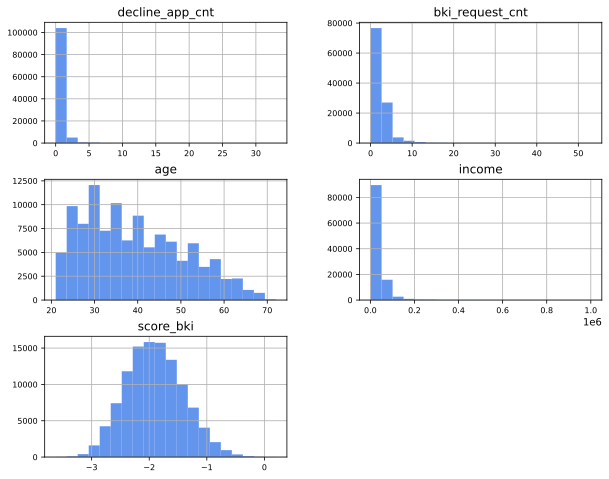

In [16]:
num_var = ['decline_app_cnt', 'bki_request_cnt', 'age', 'income', 'score_bki']

df.loc[:, num_var].hist(sharex=False, sharey=False, bins=20, xlabelsize=8, ylabelsize=8, figsize=(10, 8), color='cornflowerblue')
plt.show()

We observe what looks like exponential distribution for *decline_app_cnt*, *bki_request_cnt* and *income*. We can consider transforming the variables' probability distributions to normal probability distribution since some ML-algorithms perform better when the distribution of variables is Gaussian. *score_bki* is normally distributed with a mean value of around -2. We could rescale the atrribute data to positive values using MinMaxScaler(feature_range=(0, 1)) from sklearn. Alternatively, we could apply standartization, so that the mean of observed values is 0 and the standard deviation is 1. We will decide upon the appropriate data transformation technique later on.

Now, let's explore our binary variables by plotting them

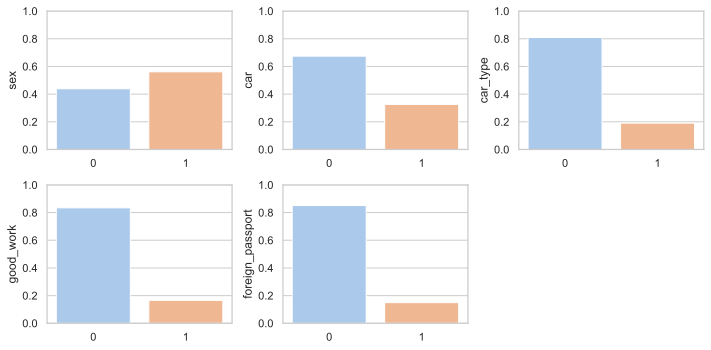

In [17]:
bin_var = ['sex', 'car', 'car_type', 'good_work', 'foreign_passport']

fig = plt.figure(figsize=(10, 5))
sns.set(style="whitegrid")
for index, col in enumerate(bin_var):
    plt.subplot(2, 3, index+1)
    f = sns.barplot(x = df.loc[:, bin_var][col].value_counts(normalize=True).index, 
                y = df.loc[:, bin_var][col].value_counts(normalize=True), palette = "pastel")
    f.set(ylim=(0, 1))
fig.tight_layout(pad=1.0)

We already mentioned some pecularities of binary attributes when doing descriptive statistics. Let's repeat:
* slightly more women than men
* less than 20% of applicants are marked as having a *good_work*
* less than 20% of applicatns have a car of some forein brand
* the majority of applicatnts do not have a foreign pass
* more than 60% of applicatnts do not have a car

There are a couple more variables waiting for visualization

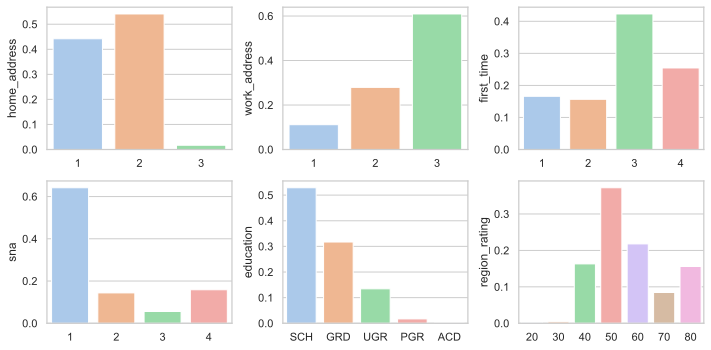

In [18]:
cat_var = ['home_address', 'work_address', 'first_time', 'sna', 'education', 'region_rating']

fig = plt.figure(figsize=(10, 5))
sns.set(style="whitegrid")
for index, col in enumerate(cat_var):
    plt.subplot(2, 3, index+1)
    f = sns.barplot(x = df.loc[:, cat_var][col].value_counts(normalize=True).index, 
                y = df.loc[:, cat_var][col].value_counts(normalize=True), palette = "pastel")
    # f.set(ylim=(0, 1))
fig.tight_layout(pad=1.0)

We do not have any insights about attributes *home_address* and *work_address*. Value 3 occures quite rare for the first one being the most frequent value for the latter. Interpretation of the variable *first_time* is not quite obvious either. Anyway, 3 is the most frequent value here. As for the *sna* feature, the majority of applicants have a connection to at least one bank client. More than 50% of the applicants have only school education. Very few apllicant from our dataset come from regions with a *region_rating* below 40, with the most frequent value in this attribute being 50.

### 3) Multimodal data visualizations

As a next step we conduct a miltivariate data analysis to discovere relationships between variables. 

Firstly, let's explore the relationship between our input variables and the target

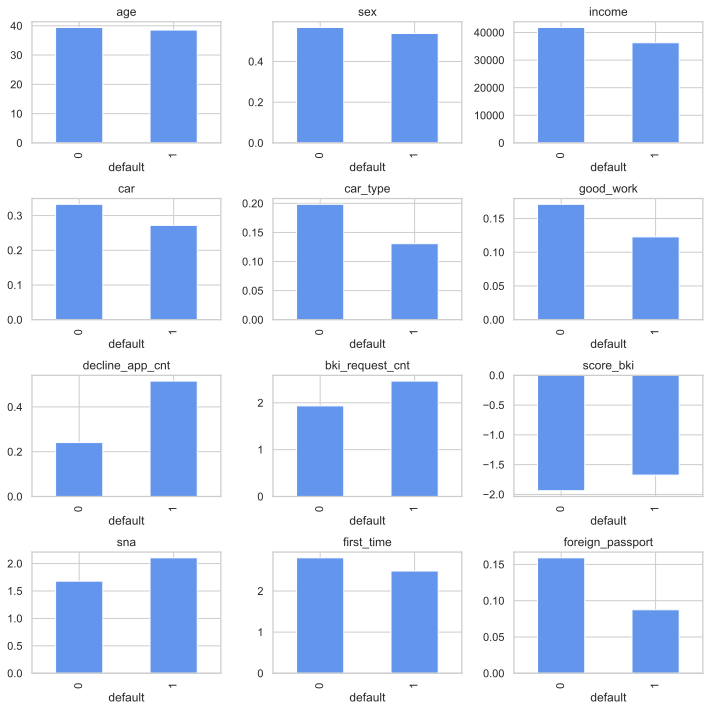

In [19]:
df_train = df[df['train']==1]

cols = ['age', 'sex', 'income', 
        'car', 'car_type', 'good_work',
        'decline_app_cnt', 'bki_request_cnt', 'score_bki',
        'sna', 'first_time', 'foreign_passport']

fig = plt.figure(figsize=(10, 10))
sns.set(style="whitegrid")
for index, col in enumerate(cols):
    plt.subplot(4, 3, index+1)
    df_train.groupby('default')[col].mean().plot(kind='bar', color='cornflowerblue')
    plt.title(col)
    # f.set(ylim=(0, 1))
fig.tight_layout(pad=1.0)

Observations:
* features *age*, *sex* and *first_time* don't seem to have any significant impact on our output variable
* default clients tend to have slightly lower *income* on average than no-default clients
* predictors *car*, *car_type*, *foreign_passport* and *good_work* can also provide useful information for our model: clients marked as having a car of some foreign brand, foreign pass and/or a good_work tend to default less frequently
* clients with less application declines (*decline_app_cnt*) tend to be more reliable on average

We can now investigate the relationship between variables *home_address*, *work_address* and our output variable

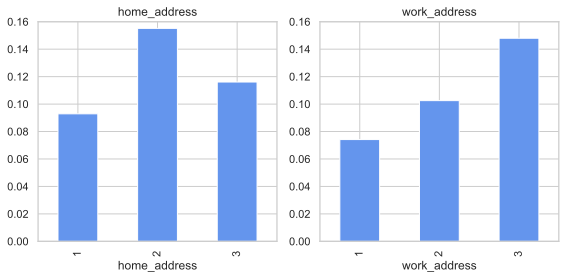

In [20]:
cols = ['home_address', 'work_address']

fig = plt.figure(figsize=(8, 4))
sns.set(style="whitegrid")
for index, col in enumerate(cols):
    plt.subplot(1, 2, index+1)
    f = df_train.groupby(col)['default'].mean().plot(kind='bar', color='cornflowerblue')
    plt.title(col)
    f.set(ylim=(0, .16))
fig.tight_layout(pad=1.0)

Clients with attributes *home_address* and *work_address* marked as 1 are less likely to default

Next, we build a Kendall correlation matrix and plot it as a heat map

In [21]:
cols_to_drop = ['client_id', 'app_date', 'train']
corr_matrix = df_train.drop(cols_to_drop, 1).corr(method='kendall')
display(corr_matrix)

,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,sna,first_time,foreign_passport,default
sex,1.000000,0.105515,-0.279488,-0.225578,-0.023387,0.040247,0.034830,0.042624,-0.092498,-0.037130,-0.063318,-0.271050,0.001644,-0.011771,-0.086326,-0.019619
age,0.105515,1.000000,-0.029707,-0.027366,-0.097911,-0.060357,-0.076417,0.034769,-0.066895,-0.002192,-0.011705,-0.065863,-0.073031,0.081824,-0.029998,-0.022108
car,-0.279488,-0.029707,1.000000,0.697939,-0.038013,0.002027,-0.035385,-0.044546,0.055134,-0.025989,-0.010738,0.269828,-0.066007,0.080269,0.107568,-0.043161
car_type,-0.225578,-0.027366,0.697939,1.000000,-0.050929,0.017521,-0.031921,-0.017689,0.084861,-0.012547,-0.000061,0.303307,-0.079059,0.093344,0.145807,-0.057484
decline_app_cnt,-0.023387,-0.097911,-0.038013,-0.050929,1.000000,-0.033559,0.161844,0.094886,-0.032382,0.010659,0.014553,-0.009109,0.068041,-0.070890,-0.030079,0.116654
good_work,0.040247,-0.060357,0.002027,0.017521,-0.033559,1.000000,0.005615,0.005132,0.060905,-0.004102,-0.001167,0.047209,-0.053773,0.050295,0.046361,-0.043361
score_bki,0.034830,-0.076417,-0.035385,-0.031921,0.161844,0.005615,1.000000,0.094513,0.004886,0.011983,0.010521,0.004998,0.057455,-0.056652,-0.016508,0.140014
bki_request_cnt,0.042624,0.034769,-0.044546,-0.017689,0.094886,0.005132,0.094513,1.000000,-0.010874,0.002572,0.000470,0.052458,0.009630,0.006959,-0.005166,0.067042
region_rating,-0.092498,-0.066895,0.055134,0.084861,-0.032382,0.060905,0.004886,-0.010874,1.000000,0.196140,0.214127,0.239574,-0.054449,0.065845,0.211663,-0.077723
home_address,-0.037130,-0.002192,-0.025989,-0.012547,0.010659,-0.004102,0.011983,0.002572,0.196140,1.000000,0.758874,0.047003,0.091757,-0.043613,0.041031,0.087258


<AxesSubplot:>

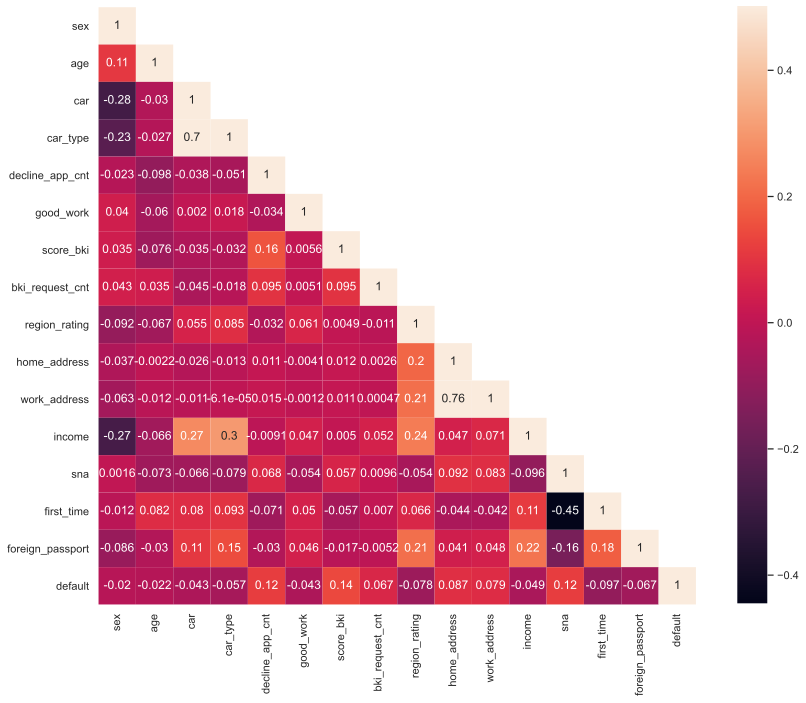

In [22]:
mask = np.array(corr_matrix)
mask[np.tril_indices_from(mask)] = False
fig,ax= plt.subplots()
fig.set_size_inches(15,11)
sns.heatmap(corr_matrix, mask=mask, vmax=.5, square=True, annot=True)

Observations:
* as expected, *income* is positevely correlated with *car*, *car_type* and *foreign_passport*
* *home_address*, *work_address*, *income* and *foreign_passport* are positevely correlated with *region_rating*
* quite strong negative correlation between *sna* and *first_time*
* strong positive correlation between *car* and *car_type*; we could probably construct one variable out of these two to avoid multicollinearity 
* same story with *home_address* and *work_address*
* female clients tend to have *car* less frequently than male clients
* female clients tend to have lower *income* than male clients
* weak positive correlation between features *foreign_passport* and *first_time*
* *score_bki* is the variable with the strongest correlation with our target (.18)

## PREPARE DATA <a name="data"></a>

### 1) Data cleaning

Now when we have some understanding about our data, we can proceed to the next step: data preparatin. We start with data cleaning, which include 
* removal of duplicates 
* removal of missing values 
* removal of outliers
* elimination of redundant columns

As already mentioned above, the only variable containing missing values is *education*.

In [23]:
df.isnull().sum().sort_values(ascending=False).head(3)

education    478
train          0
default        0
dtype: int64

Let's replace them with the most frequent value (mode)

In [24]:
mode = df['education'].mode()[0]

df['education'].fillna(mode, inplace=True)

In [25]:
df.isnull().sum().sum()

0

Next, we will check for duplicates in our dataset and remove them if found

In [26]:
dups = df.duplicated()
print(dups.any())

False


There are no duplicates in our data

Finally, we can get rid of the column *client_id*, which provides zero useful information for our model

In [27]:
df.drop('client_id', 1, inplace=True)

Now, we check if our numiric variables contain outliers

In [28]:
num_var = ['decline_app_cnt', 'bki_request_cnt', 'age', 'income', 'score_bki']

fig = plt.figure(figsize=(10, 10))
sns.set(style="whitegrid")
for index, col in enumerate(num_var):
    plt.subplot(3, 2, index+1)
    sns.boxplot(df[col])
    plt.title(col)
    # f.set(ylim=(0, 1))
fig.tight_layout(pad=1.0)

On a box and whisker plot, we can see that variables *decline_app_cnt*, *bki_request_cnt*, *income* and *score_bki* all contain outliers. The variable *income* is the most concerning one having quite a few values above 75th percentile. Let's try to reduce the number of outliers.

We will remove or replace values that lie outside 3 times the Interquartile Range (IQR). The IQR can be calculated as the difference between the 75th and 25th percentiles.

In [29]:
upper_threshold = []
lower_threshold = []

for item in num_var:
    q25, q75 = np.percentile(df[item], 25), np.percentile(df[item], 75)
    iqr = q75 - q25
    cut_off = iqr * 3
    upper = q75 + cut_off
    lower = q25 - cut_off
    upper_threshold.append(upper)
    lower_threshold.append(lower)

In [30]:
print(upper_threshold)
print('='*48)
print(lower_threshold)

[0.0, 12.0, 102.0, 132000.0, 0.5097484000000014]
[0.0, -9.0, -24.0, -64000.0, -4.338070222500002]


For the *decline_app_cnt* we can see, that the value above 3 time the IQR is still 0. Let's define an upper threshold for the atrribute as 5.

In [31]:
print(df[df['decline_app_cnt']>5].shape)
print(df[(df['decline_app_cnt']>5) & (df['train']==0)].shape)

(329, 19)
(91, 19)


There are 329 observations that lie above the upper threshold; 91 of them are in the test set, where they cannot be removed due to further submission issues. So we replace them with the upper threshold value.

In [32]:
# drop observations with outliers from train set
df.drop(df[(df['decline_app_cnt']>5) & (df['train']==1)].index, inplace=True)
# replace outliers in test set
df.loc[df['decline_app_cnt']>5, 'decline_app_cnt'] = 5

Same procedure for the feature *bki_request_cnt*. Here we apply the calculated upper threshold which is 12 for the variable.

In [33]:
# drop observations with outliers from train set
df.drop(df[(df['bki_request_cnt']>upper_threshold[1]) & (df['train']==1)].index, inplace=True)
# replace outliers in test set
df.loc[df['bki_request_cnt']>upper_threshold[1], 'bki_request_cnt'] = upper_threshold[1]

... and for *income*

In [34]:
# drop observations with outliers from train set
df.drop(df[(df['income']>upper_threshold[3]) & (df['train']==1)].index, inplace=True)
# replace outliers in test set
df.loc[df['income']>upper_threshold[3], 'income'] = upper_threshold[3]

All values of the feature *score_bki* lie within the thresholds, so it remains as it is. 

Let's check the boxplots after cleaning.

In [35]:
fig = plt.figure(figsize=(10, 10))
sns.set(style="whitegrid")
for index, col in enumerate(num_var):
    plt.subplot(3, 2, index+1)
    sns.boxplot(df[col])
    plt.title(col)
    # f.set(ylim=(0, 1))
fig.tight_layout(pad=1.0)

Much better! Still a lot of outliers in *income*, but I am unwilling to loose so many data points. Let's check how many observations we have lost due to data cleaning.

In [36]:
datapoints_lost = df_train.shape[0] - df[df['train']==1].shape[0]
print(datapoints_lost, round(datapoints_lost / df_train.shape[0], 3))

2735 0.037


We have lost 2735 observations; less than 4% of our train set.

### 1.1) Baseline Model

We now train a simple baseline model, which score we will then try to improve.

In [37]:
df_train.head()

,client_id,app_date,education,sex,age,car,car_type,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,home_address,work_address,income,sna,first_time,foreign_passport,default,train
0,25905,01FEB2014,SCH,0,62,1,1,0,0,-2.008753,1,50,1,2,18000,4,1,0,0,1
1,63161,12MAR2014,SCH,1,59,0,0,0,0,-1.532276,3,50,2,3,19000,4,1,0,0,1
2,25887,01FEB2014,SCH,0,25,1,0,2,0,-1.408142,1,80,1,2,30000,1,4,1,0,1
3,16222,23JAN2014,SCH,1,53,0,0,0,0,-2.057471,2,50,2,3,10000,1,3,0,0,1
4,101655,18APR2014,GRD,0,48,0,0,0,1,-1.244723,1,60,2,3,30000,1,4,1,0,1


In [38]:
X = df_train.drop(['client_id', 'app_date', 'education', 'train', 'default'], 1)
y = df_train.loc[:, 'default']

In [39]:
baseline_model = LogisticRegression(penalty='none')
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=29)
scores = cross_val_score(baseline_model, X, y, scoring='roc_auc', cv=kfold, n_jobs=-1)
print('ROC AUC: %.3f (%.3f)' % (np.mean(scores)*100, np.std(scores)*100))

ROC AUC: 60.215 (4.015)


Well... there is definitely some room for improvement! Let's move on.

### 2) Feature engineering

First off, let's encode the *education* feature. It is an ordinal variable, where 'SCH' stands for the lowest education level and 'ACD' for the highest

<AxesSubplot:>

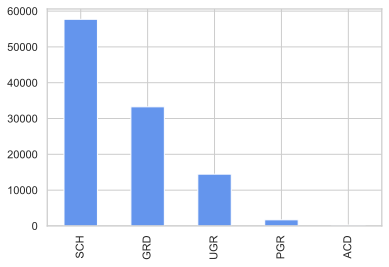

In [40]:
df['education'].value_counts().plot(kind='bar', color='cornflowerblue')

In [41]:
edu = {'SCH': 1, 'GRD': 2, 'UGR': 3, 'PGR': 4, 'ACD': 5}
df['education'] = df.education.map(edu)

In [42]:
df_train = df[df['train']==1]
df_train.groupby('default')['education'].mean()

default
0    1.647295
1    1.521021
Name: education, dtype: float64

There is a slight impact of the education level on the likelihood of default (the higher education - the less likely default)

Next, let's deal with multicollinearity we discovered in our multivariate data analysis

In [43]:
# construct new variable 'car' = 'car' + 'car_type'
df['car'] = df['car'] + df['car_type']

# drop redundant columns
df.drop('car_type', 1, inplace=True)

In [44]:
# construct new variable 'address' = 'home_address' * 'work_address'
df['address'] = df['home_address'] * df['work_address']

# drop redundant columns
df.drop(['home_address', 'work_address'], 1, inplace=True)

We can now construct a couple more features using some domain knowledge, intuition and information we derived from the analysis.

The first new variable is 'middle_class'. The logic behind this new variable is that it combines several attributes each of which proved to have an impact on the target. The combined effect of the new feature can provide high enogh information gain to improve our future model.

In [45]:
df['middle_class'] = df['car'] + df['foreign_passport'] \
                            + df['good_work'] - df['education'] - df['address']

The next new feature 'bad_applicant' combines the effects of the variables which contain the most pronounced indicators for default clients. The higher the value of the new feature, the higher the likelihood of default.

In [46]:
df['bad_client'] = df['sna'] + df['decline_app_cnt'] + df['bki_request_cnt']

Finally, we add 2nd degree polynoms to the variables *bad_client* and *score_bki*.

In [47]:
for col in ['bad_client', 'score_bki']:
    df[col + '^2'] = df[col] ** 2

In [48]:
df.head()

,app_date,education,sex,age,car,decline_app_cnt,good_work,score_bki,bki_request_cnt,region_rating,...,sna,first_time,foreign_passport,default,train,address,middle_class,bad_client,bad_client^2,score_bki^2
0,01FEB2014,1,0,62,2,0,0,-2.008753,1.0,50,...,4,1,0,0,1,2,-1,5.0,25.0,4.035088
1,12MAR2014,1,1,59,0,0,0,-1.532276,3.0,50,...,4,1,0,0,1,6,-7,7.0,49.0,2.347870
2,01FEB2014,1,0,25,1,2,0,-1.408142,1.0,80,...,1,4,1,0,1,2,-1,4.0,16.0,1.982865
3,23JAN2014,1,1,53,0,0,0,-2.057471,2.0,50,...,1,3,0,0,1,6,-7,3.0,9.0,4.233188
4,18APR2014,2,0,48,0,0,1,-1.244723,1.0,60,...,1,4,1,0,1,6,-6,2.0,4.0,1.549335


As a next step, we will work with the *app_date* variable which represents time series. 

In [49]:
# transform into pandas datetime format
df['app_date'] = df['app_date'].apply(lambda x: datetime.strptime(x, "%d%b%Y"))

In [50]:
print(df['app_date'].min(), df['app_date'].max())

2014-01-01 00:00:00 2014-04-30 00:00:00


Our data have been collected during the first four months of 2014 (1st Jan 2014 - 30th Apr 2014).

In [51]:
# construct new variables
df['week_day'] = df['app_date'].dt.dayofweek # new var: day the week
df['year_day'] = df['app_date'].dt.dayofyear # new var: day the year 
df['month'] = df['app_date'].dt.month # new var: month
df['weekend'] = df['week_day'].apply(lambda x: 1 if x>4 else 0) # new var: weekend flag

df.drop('app_date', 1, inplace=True)

date_var = ['week_day', 'year_day', 'month', 'weekend']

df_train = df[df['train']==1]
df_test = df[df['train']==0]

<AxesSubplot:ylabel='month'>

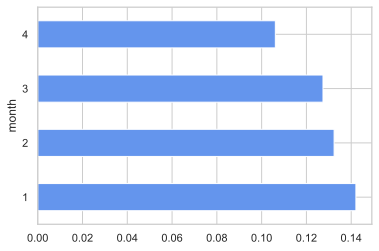

In [52]:
df[df['train']==1].groupby('month')['default'].mean().plot(kind='barh', color='cornflowerblue')

It looks like the default rate was dropping over time being the lowest in April.

We now make dummy variables out of our categorical variables.

In [53]:
cat_feat = ['address', 'region_rating', 'education', 'first_time', 'sna', 'week_day', 'middle_class', 'month']

In [54]:
df = pd.get_dummies(df, columns=cat_feat, drop_first=True)

In [55]:
df.columns

Index(['sex', 'age', 'car', 'decline_app_cnt', 'good_work', 'score_bki',
       'bki_request_cnt', 'income', 'foreign_passport', 'default', 'train',
       'bad_client', 'bad_client^2', 'score_bki^2', 'year_day', 'weekend',
       'address_2', 'address_3', 'address_4', 'address_6', 'address_9',
       'region_rating_30', 'region_rating_40', 'region_rating_50',
       'region_rating_60', 'region_rating_70', 'region_rating_80',
       'education_2', 'education_3', 'education_4', 'education_5',
       'first_time_2', 'first_time_3', 'first_time_4', 'sna_2', 'sna_3',
       'sna_4', 'week_day_1', 'week_day_2', 'week_day_3', 'week_day_4',
       'week_day_5', 'week_day_6', 'middle_class_-13', 'middle_class_-12',
       'middle_class_-11', 'middle_class_-10', 'middle_class_-9',
       'middle_class_-8', 'middle_class_-7', 'middle_class_-6',
       'middle_class_-5', 'middle_class_-4', 'middle_class_-3',
       'middle_class_-2', 'middle_class_-1', 'middle_class_0',
       'middle_class_1', '

In [56]:
df.head()

,sex,age,car,decline_app_cnt,good_work,score_bki,bki_request_cnt,income,foreign_passport,default,...,middle_class_-4,middle_class_-3,middle_class_-2,middle_class_-1,middle_class_0,middle_class_1,middle_class_2,month_2,month_3,month_4
0,0,62,2,0,0,-2.008753,1.0,18000.0,0,0,...,0,0,0,1,0,0,0,1,0,0
1,1,59,0,0,0,-1.532276,3.0,19000.0,0,0,...,0,0,0,0,0,0,0,0,1,0
2,0,25,1,2,0,-1.408142,1.0,30000.0,1,0,...,0,0,0,1,0,0,0,1,0,0
3,1,53,0,0,0,-2.057471,2.0,10000.0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,48,0,0,1,-1.244723,1.0,30000.0,1,0,...,0,0,0,0,0,0,0,0,0,1


### 3) Data transform

Many machine learning algorithms perform better when numerical input variables (and even output variables in the case of regression) have a standard probability distribution, such as a Gaussian (normal) or a uniform distribution. Some of our input numerical variables have a highly skewed distribution as well as outlieres. Therefore, we transform these input variables to have a standard probability distribution (or at least close to normal distribution).

In [57]:
# define variables with skewed distribution
var_to_transform = ['age', 'bki_request_cnt', 'income', 'bad_client', 'bad_client^2']

# get indexes of the columns
var_ix = []
for item in var_to_transform:
    var_ix.append(list(df.columns).index(item))
    
print(var_ix)

[1, 6, 7, 11, 12]


In [58]:
cols = list(df.columns)
columns = var_to_transform + [el for el in cols if el not in var_to_transform]

In [59]:
# transform distribution of the variables using QuantileTransformer from sklearn
t = [('qt', QuantileTransformer(output_distribution='normal'), var_ix)]
transformer = ColumnTransformer(transformers=t, remainder='passthrough')

df_transformed = transformer.fit_transform(df)

Next, we rescale our data using MinMaxScaler, so that there are no differences in the scales across input variables that could make our madel less accurate.

In [60]:
df_scaled = MinMaxScaler().fit_transform(df_transformed)
df = pd.DataFrame(df_scaled, columns=columns)

Now, let's check the distribution of our transformed variables.

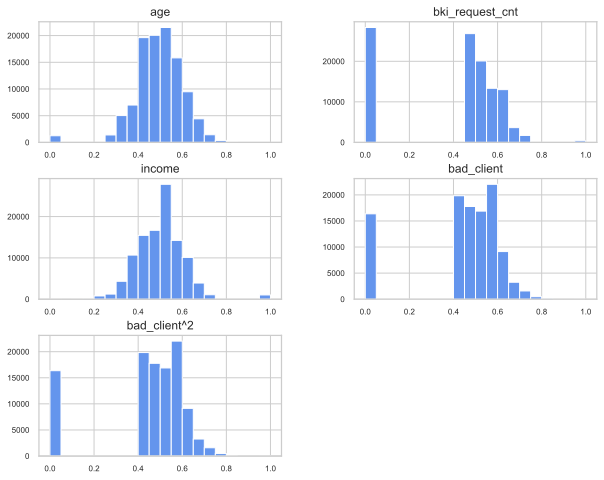

In [61]:
df.loc[:, var_to_transform].hist(sharex=False, sharey=False, bins=20, 
                                 xlabelsize=8, ylabelsize=8, figsize=(10, 8), color='cornflowerblue')
plt.show()

The distributions now look much more Gaussian.

In [62]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
age,107413.0,0.497180,0.106494,0.0,0.439391,0.497949,0.565699,1.0
bki_request_cnt,107413.0,0.400279,0.247751,0.0,0.000000,0.472986,0.568936,1.0
income,107413.0,0.502439,0.104491,0.0,0.438061,0.501810,0.562982,1.0
bad_client,107413.0,0.446517,0.201597,0.0,0.433538,0.480442,0.555827,1.0
bad_client^2,107413.0,0.446516,0.201595,0.0,0.433538,0.480442,0.555827,1.0
sex,107413.0,0.566254,0.495593,0.0,0.000000,1.000000,1.000000,1.0
car,107413.0,0.249849,0.391833,0.0,0.000000,0.000000,0.500000,1.0
decline_app_cnt,107413.0,0.050765,0.135122,0.0,0.000000,0.000000,0.000000,1.0
good_work,107413.0,0.165371,0.371517,0.0,0.000000,0.000000,0.000000,1.0
score_bki,107413.0,0.449345,0.129945,0.0,0.356774,0.445381,0.537099,1.0


As we can see, all our data values now lie between 0 and 1. Binary variables including our target remained unchanged.

In [63]:
df_train = df[df['train']==1]
df_test = df[df['train']==0]

### 4) Feature Selection

In this section, we select the most valuable features with Mutual Information Statistics, i.e. we are looking for attributes wich provide the highest information gain (entropy reduction) over the whole segmentation.

In [64]:
# split into input and output variables
X, y = df_train.drop(['default', 'train'], 1), df_train.loc[:, 'default']

In [65]:
columns = X.columns

In [66]:
fs = SelectKBest(score_func=mutual_info_classif, k='all')
fs.fit(X, y)
X = fs.transform(X)

<AxesSubplot:>

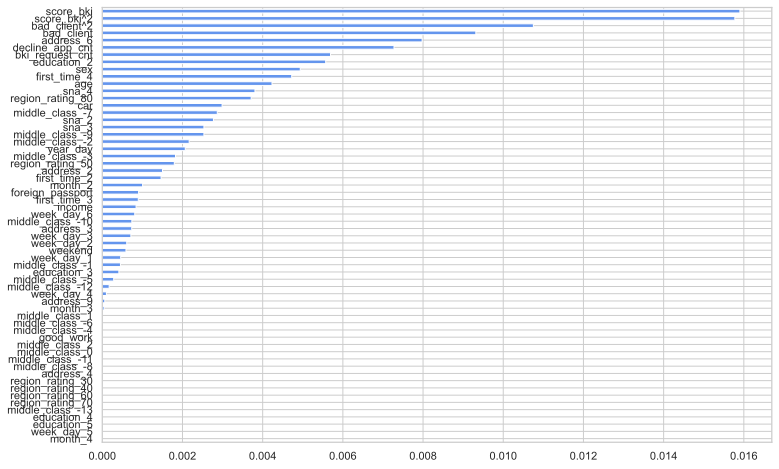

In [67]:
# plot the scores of the features
feat_importance = pd.Series(fs.scores_, index=columns)
feat_importance.sort_values(inplace = True)
feat_importance.plot(kind = 'barh', figsize=(12, 8), color='cornflowerblue')

*score_bki* and *score_bki^2* are by a large margin the most informative features according to the mutual information statistics. We also see that some of constructed variables have rather high scores. A bunch of attributes don't seem to convey any useful insights. We don't need to drop 'em right now for we will use regularization in our model.

In [68]:
df.sample(5)

,age,bki_request_cnt,income,bad_client,bad_client^2,sex,car,decline_app_cnt,good_work,score_bki,...,middle_class_-4,middle_class_-3,middle_class_-2,middle_class_-1,middle_class_0,middle_class_1,middle_class_2,month_2,month_3,month_4
74950,0.554688,0.637707,0.580695,0.588697,0.588697,1.0,0.0,0.0,0.0,0.373764,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
14737,0.349309,0.568936,0.449792,0.555827,0.555827,0.0,0.0,0.2,0.0,0.162206,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
66528,0.386582,0.526262,0.607132,0.519558,0.519558,0.0,1.0,0.0,0.0,0.583576,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
44563,0.369014,0.472986,0.501810,0.519558,0.519558,1.0,0.0,0.2,0.0,0.308487,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
37194,0.467926,0.472986,0.470846,0.555827,0.555827,0.0,0.0,0.0,0.0,0.319957,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


## MODELLING <a name="modelling"></a>

The long and tedious data preparation part is over, and we can finally begin building our predictive model. In this section, we will train and evaluate a simple Logistic Regression model. But first of all, we need to split our data into input and output variables as well as into train and validation sets.

In [69]:
# split into input and output variables
X = df[df['train']==1].drop(['default', 'train'], 1)
X_sub = df[df['train']==0].drop(['default', 'train'], 1) # our test (or submission) set
y = df[df['train']==1].loc[:, 'default']
# split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=29)

Next, we instantiate the model and find hyperparameters which result in highest ROC AUC.

In [70]:
model = LogisticRegression()

In [71]:
kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=29)

param_grid = { 'penalty': ['l1', 'l2', 'elasticnet'], 
               'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga'],
               'C': [0.1, 1, 10],
               'multi_class': ['auto', 'ovr', 'multinomial'],
               'dual': [False, True] }

grid_search = RandomizedSearchCV(model, 
                                 param_distributions=param_grid, 
                                 cv=kfold,
                                 n_iter=35,
                                 n_jobs=-1,
                                 scoring='roc_auc')

In [72]:
grid_search.fit(X_train, y_train)
print("Best cross-validation ROC-AUC accuracy: {:.2f}".format(grid_search.best_score_))
print("Best parameters: ", grid_search.best_params_)

Best cross-validation ROC-AUC accuracy: 0.73
Best parameters:  {'solver': 'sag', 'penalty': 'l2', 'multi_class': 'multinomial', 'dual': False, 'C': 1}


We now train a model with these hyperparameters and evaluate it.

              precision    recall  f1-score   support

         0.0       1.00      0.88      0.93     21185
         1.0       0.02      0.46      0.04       135

    accuracy                           0.87     21320
   macro avg       0.51      0.67      0.49     21320
weighted avg       0.99      0.87      0.93     21320

ROC-AUC score: 73.02 %
Recall: 45.93 %


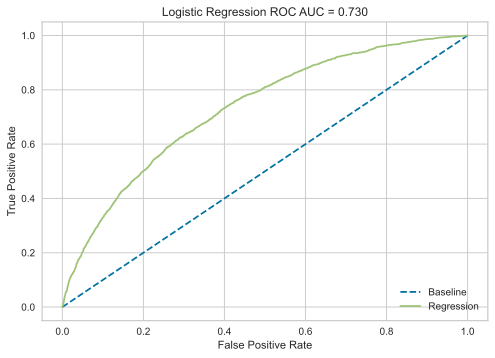

In [83]:
# train the model with optimal hyperparameters
model = LogisticRegression(solver='sag', penalty='l2', multi_class='multinomial', dual=False, C=1)
model.fit(X_train, y_train)

# evaluate the model
y_hat = model.predict(X_test)
# predict probabilities
y_hat_proba = model.predict_proba(X_test)
probs = y_hat_proba[:, 1]

# display the scores
score = classification_report(y_hat, y_test)
print(score)
print('='*53)
roc_auc = roc_auc_score(y_test, model.decision_function(X_test))
print(f'ROC-AUC score: {round(roc_auc*100, 2)} %')
print('='*53)
recall_s = recall_score(y_hat, y_test)
print(f'Recall: {round(recall_s*100, 2)} %')

# ROC curve
fpr, tpr, thresholds = roc_curve(y_test, model.decision_function(X_test))

# plot the ROC curve
plt.figure()
plt.plot([0, 1], label='Baseline', linestyle='--')
plt.plot(fpr, tpr, label = 'Regression')
plt.title('Logistic Regression ROC AUC = %0.3f' % roc_auc)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc = 'lower right')
plt.show()

Our Logistic Regression model with l2-regularization has an accuracy of 87% which is quite impressive at first glance. We should keep in mind thogh that we are dealing with a severe class imbalance here (far fewer positive instances than negative ones). Hence, accuracy isn't a good choice for evaluation metric.

Far more reliable is ROC AUC score, which computes the area under the ROC curve (or receiver operating characteristic curve) and can be interpreted as *the probability that the scores given by a classifier will rank a randomly chosen positive instance higher than a randomly chosen negative one*. ROC AUC for our model is 73% - substantial improvement over our baseline model!

However, for imbalanced classification with a severe skew and few examples of the minority class, the ROC AUC can be also misleading. This is because a small number of correct or incorrect predictions can result in a large change in the ROC curve or ROC AUC score. This is exactly what happened in our case: as Recall Score reveals, the model only correctly predicts 46% positive instances out of all positive instances in the verification set (Remember that Recall - or *sensitivity* - can be defined as the ability of the classifier to find all the positive samples). This means that our algorithm correctly predicts less than half of potential default applicants, which will most likely not be accepted by the bank's share holders.

So we need to icrease the recall score somehow. There are many techniques that may be used to address an imbalanced classification problem, such as resampling the training dataset and developing customized version of machine learning algorithms. Nevertheless, perhaps the simplest approach to handle a severe class imbalance is to **change the decision threshold**. The decision threshold (a.k.a *discrimination threshold* or simply the *threshold*) governs the conversion of predicted probability into a class label. The default value for the threshold is 0.5, meaning that predicted probability values less than the threshold of 0.5 are assigned to class 0 and values greater than or equal to 0.5 are assigned to class 1. By manually lowering or increasing the threshold we can influence the sensivity of the algorithm.

Now, let's find out what decision threshold maximizes our F1-measure. The F1 measure is the harmonic mean between precision and recall. Optimizing this metric produces the best balance between precision and recall.

* [Source 1](https://machinelearningmastery.com/roc-curves-and-precision-recall-curves-for-imbalanced-classification/)
* [Source 2](https://machinelearningmastery.com/threshold-moving-for-imbalanced-classification/)
* [Source 3](https://scikit-learn.org/stable/modules/model_evaluation.html#precision-recall-f-measure-metrics)
* [Source 4](https://www.scikit-yb.org/en/latest/api/classifier/threshold.html)

In [84]:
thresholds = np.arange(0, 1, 0.01)

# apply threshold to positive probabilities to create labels
def to_labels(pos_probs, threshold):
    return (pos_probs >= threshold).astype('int')

# evaluate each threshold
scores = [f1_score(y_test, to_labels(probs, t), average='binary') for t in thresholds]

# get best threshold
ix = np.argmax(scores)
optimal_threshold = thresholds[ix]
print('Threshold=%.3f, F1-score=%.5f' % (optimal_threshold, scores[ix]))

Threshold=0.160, F1-score=0.34954


In [85]:
y_hat_lower_threshold = probs >= optimal_threshold
print(classification_report(y_test, y_hat_lower_threshold))

              precision    recall  f1-score   support

         0.0       0.92      0.77      0.84     18618
         1.0       0.26      0.55      0.35      2702

    accuracy                           0.74     21320
   macro avg       0.59      0.66      0.59     21320
weighted avg       0.84      0.74      0.78     21320



The threshold of .160 maximizes the F1-measure. By setting this value as a discrimination threshold, we managed to increase our recall up to .55. Note though that both precision and accuracy dropped down.

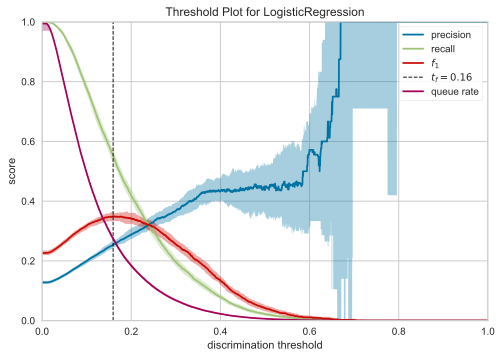

<AxesSubplot:title={'center':'Threshold Plot for LogisticRegression'}, xlabel='discrimination threshold', ylabel='score'>

In [76]:
# visualization: threshold optimization
from yellowbrick.classifier import DiscriminationThreshold

visualizer = DiscriminationThreshold(model)
visualizer.fit(X, y)
visualizer.show()

Note that we could further lower the decision threshold in order to reduce the number of false positives. However, one should remember that there is a trade-off between precision and recall, i.e. the increas in recall comes with precision decrease. In different business scenarios, we may have various costs associated with false positive and false negative misclassification, a so-called *cost matrix*. For a bank, for example, it could be profitable to acquire more customers at expense of certain amount of defaults. Since we are not provided with the cost matrix, we just choose the threshold that maximizes our F1-measure.

In [86]:
# predict probabilities
y_hat_proba = model.predict_proba(X_test)
probs = y_hat_proba[:, 1]

# display the scores
score = classification_report(y_test, y_hat_lower_threshold)
print(score)
print('='*53)
roc_auc = roc_auc_score(y_test, model.decision_function(X_test))
print(f'ROC-AUC score: {round(roc_auc*100, 2)} %')
print('='*53)
recall_s = recall_score(y_test, y_hat_lower_threshold)
print(f'Recall: {round(recall_s*100, 2)} %')

              precision    recall  f1-score   support

         0.0       0.92      0.77      0.84     18618
         1.0       0.26      0.55      0.35      2702

    accuracy                           0.74     21320
   macro avg       0.59      0.66      0.59     21320
weighted avg       0.84      0.74      0.78     21320

ROC-AUC score: 73.02 %
Recall: 55.07 %


## SUBMISSION <a name="submission"></a>

In [78]:
X_sub.head()

,age,bki_request_cnt,income,bad_client,bad_client^2,sex,car,decline_app_cnt,good_work,score_bki,...,middle_class_-4,middle_class_-3,middle_class_-2,middle_class_-1,middle_class_0,middle_class_1,middle_class_2,month_2,month_3,month_4
71064,0.428226,0.568936,0.580695,0.519558,0.519558,0.0,1.0,0.0,0.0,0.353707,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
71065,0.511489,0.526262,0.244993,0.703840,0.703840,1.0,0.0,1.0,0.0,0.554233,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
71066,0.577147,0.472986,0.501810,0.433538,0.433538,0.0,1.0,0.0,0.0,0.505509,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
71067,0.620495,0.472986,0.412039,0.433538,0.433538,0.0,0.0,0.0,0.0,0.326958,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
71068,0.504828,0.000000,0.706181,0.000000,0.000000,1.0,0.0,0.0,0.0,0.297327,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [79]:
# train the model with optimal hyperparameters on the whole train set
model = LogisticRegression(solver='lbfgs', penalty='l2', multi_class='auto', dual=False, C=1)
model.fit(X, y)

LogisticRegression(C=1)

In [80]:
submission = model.predict_proba(X_sub)[:,1]
submission[:10]

array([0.04126003, 0.38225842, 0.07743129, 0.09834733, 0.02294429,
       0.15334237, 0.3130691 , 0.02428246, 0.02050819, 0.02284206])

In [81]:
submit = pd.DataFrame(test_id)
submit['default'] = submission

In [82]:
submit.sample(5)

,client_id,default
26636,57879,0.089648
30745,46113,0.071808
10954,99314,0.076728
35905,84760,0.247014
3884,7295,0.102838


In [ ]:
# submit.to_csv('submission1.csv', index=False)